## Diabetes Prediction: A Comparative Analysis between Logistic Regression and LASSO Models

#### Authors - GROUP 29 : Maxwell Woodfield (19511435), Muhammad Shahbaz Murtaza (61140299), Gloria Yi (40509663), Sohayl Allibhai (94806650)

In [45]:
#loaded libraries
suppressWarnings({library(tidyverse)
                  library(dplyr)
                  library(ggplot2)
                  library(GGally)
                  library(gridExtra)
                  library(grid)
                  library(reshape2)
                  library(leaps) 
                  library(glmnet)
                  library(broom)
                  library(pROC)})

## 1. Introduction: 

Diabetes is a group of metabolic conditions characterized by high blood sugar (hyperglycemia) due to partial or total insulin deficiency. Prolonged high blood sugar can lead to complications, including damage to the eyes, kidneys, and nerves, as well as an increased risk of heart attack, stroke, and peripheral artery disease. Beyond the medical impact, diabetes poses significant economic burdens due to its costly treatment and the premature illness and deaths it causes. For individuals, it is a lifelong condition requiring daily management of diet, lifestyle, and medications, often tied to emotional challenges like anxiety and depression. (Egan & Dinneen, 2022)

The dataset used in this analysis originates from the nation Institute of Diabetes and Digestive and Kidney Diseases and was retrieved from Kaggle: https://www.kaggle.com/datasets/whenamancodes/predict-diabities?resource=download

It contains 768 observations of female patients at least 21 years old of Pima Indian heritage and the following 9 variables:


In [48]:
#Run this for column descriptions
cat("Variable                  \tDescription                                    \tType\n")
cat("--------                  \t-----------                                    \t----\n")
cat("Pregnancies               \tTo express the number of pregnancies           \tInteger\n")
cat("Glucose                   \tTo express the glucose level in blood          \tInteger\n")
cat("BloodPressure             \tTo express the blood pressure measurement      \tInteger\n")
cat("SkinThickness             \tTo express the thickness of the skin           \tInteger\n")
cat("Insulin                   \tTo express the insulin level in blood          \tInteger\n")
cat("BMI                       \tTo express the body mass index                 \tDecimal\n")
cat("DiabetesPedigreeFunction  \tTo express the diabetes genetic predisposition \tDecimal\n")
cat("Age                       \tTo express the age                             \tInteger\n")
cat("Outcome                   \tTo express the final result (1 = Yes, 0 = No)  \tInteger\n")

Variable                  	Description                                    	Type
--------                  	-----------                                    	----
Pregnancies               	To express the number of pregnancies           	Integer
Glucose                   	To express the glucose level in blood          	Integer
BloodPressure             	To express the blood pressure measurement      	Integer
SkinThickness             	To express the thickness of the skin           	Integer
Insulin                   	To express the insulin level in blood          	Integer
BMI                       	To express the body mass index                 	Decimal
DiabetesPedigreeFunction  	To express the diabetes genetic predisposition 	Decimal
Age                       	To express the age                             	Integer
Outcome                   	To express the final result (1 = Yes, 0 = No)  	Integer


This analysis aims to build a classification model to predict whether a female patient of at least 21 years old of Pima Indian heritage would have diabetes (Outcome) based on the explanatory variables. The selected explanatory variables will be determined later on. 

Before we proceeded, we took the time to anticipate some variables that could likely influence our predictions.  

BMI has a strong correlation with obesity, which makes us deduce that BMI is a critical variable for predicting diabetes. As Egan and Dineen (2022) highlight, the strong link between obesity and diabetes risk makes BMI relevant. Obesity is a primary driver of insulin resistance, an early marker in type 2 diabetes development. Given that individuals with higher BMI are significantly more likely to develop compared to those with normal weight, incorporating BMI into our predictive model will help identify individuals at higher risk. By using BMI alongside other predictors, our model can more accurately assess diabetes likelihood in this population.

Blood glucose levels are strongly associated with diabetes, as the condition is characterized by abnormal glucose regulation. According to the American Diabetes Association (2010), diabetes risk increases continuously with glucose levels, making this variable critical for analysis.

The Diabetes pedigree function provides a quantifiable measure of the patient’s genetic predisposition to diabetes based on family history. The article explains that type 2 diabetes is a polygenic disorder, meaning that it develops through interactions between multiple genes and environmental factors scattered across the genome. This genetic construction suggests that family history would be valuable in predicting diabetes. (Ali.O, 2023)

## 2. EDA: 

#### I. Data Wrangling and Loading: 

##### Reading the Tidy Dataset into R

In [2]:
# Main developer: Gloria
url <- "https://raw.githubusercontent.com/GloriaYi/STAT301-project/refs/heads/main/diabetes.csv"
diabete <- read.csv(url, header = TRUE)
head(diabete)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1
6,5,116,74,0,0,25.6,0.201,30,0


In [3]:
nrow(diabete)

[1] 768

We begin the explanatory analysis by loading in our dataset downloaded from Kaggle and uploaded to Github for external access. As seen from the above glimpse of the data, the data frame is in tibble form with each column containing one variable, each row containing a single observation and each column row having a single value. The number of rows has also been displayed to indicate the total observations in the original data, 768.

##### Checking for Missing Values

In [4]:
#Main developer: Gloria
missing_counts <- diabete |> 
    summarize_all(~ sum(str_trim(.) %in% c("", '[]')))
missing_counts

Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0,0,0,0,0,0,0,0,0


Above displays the number of missing (or N/A) counts of each variable in the dataset, we can seen there are no missing values that need to be accounted for.

#### II. Visualizations: 

##### Plotting the Raw Data with a Scatter Plot Matrix

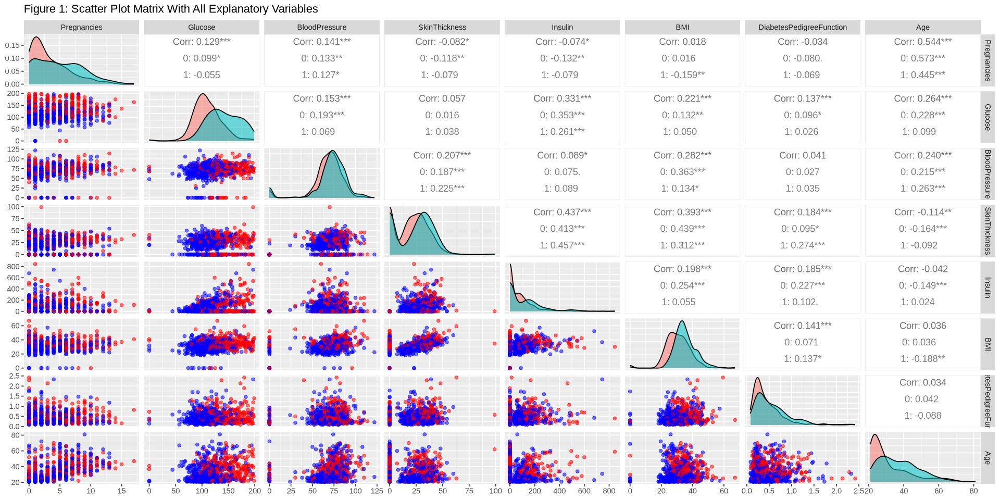

In [5]:
# Main developer: Maxwell 
options(warn =  -1)
options(repr.plot.width = 16, repr.plot.height = 8)

plot <- ggpairs(diabete, columns = 1:8,   
        aes(color = factor(Outcome), alpha = 0.5)) +
  scale_color_manual(values = c("0" = "blue", "1" = "red"),
                     labels = c("0" = "No", "1" = "Yes")) +
  labs(title = "Figure 1: Scatter Plot Matrix With All Explanatory Variables") 
plot
options(warn =  0)

We use a scatter plot matrix in Figure 1 to visualize each of the explanatory variables interaction with each of the response groups (0 or 1). The blue points and distributions represent each observation with Outcome = 0 (or not having diabetes), and the red points, conversely, represent patients with diabetes i.e Outcome = 1. From the correlations among the explanatory variables, we do not see any signs of multicollinearity as the highest correlation coefficient is 0.544, among Age and Pregnancies. 

From the distributions of each explanatory variable, we see that there is a heavy right skew among Skin Thickness and Insulin, indicating a high volume of observations coded as 0. Figures 2.1 and 2.2 corroborate these findings. As these variables have a high volume of 0 values, they are unmeasured and could result in a high degree of bias or inaccuracy within our prediction model if not accounted for. 


##### Histogram of Insulin and SkinThickness

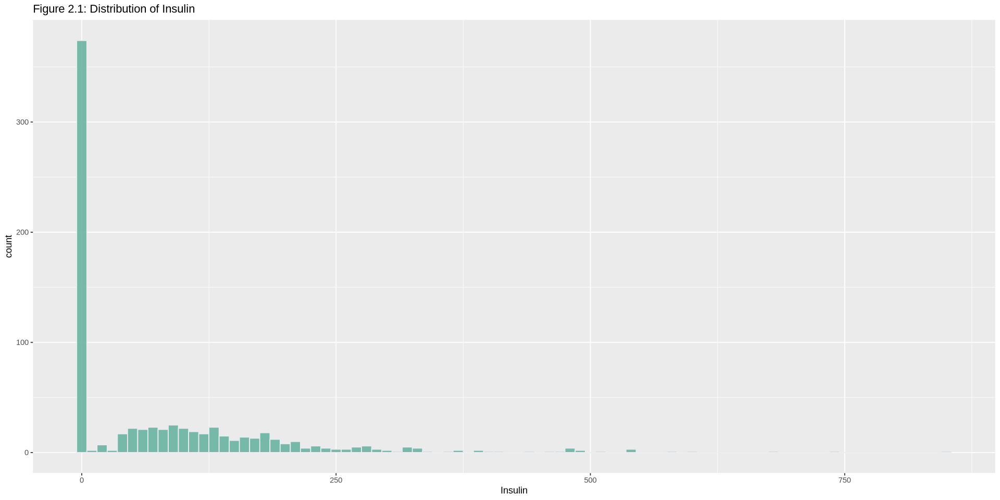

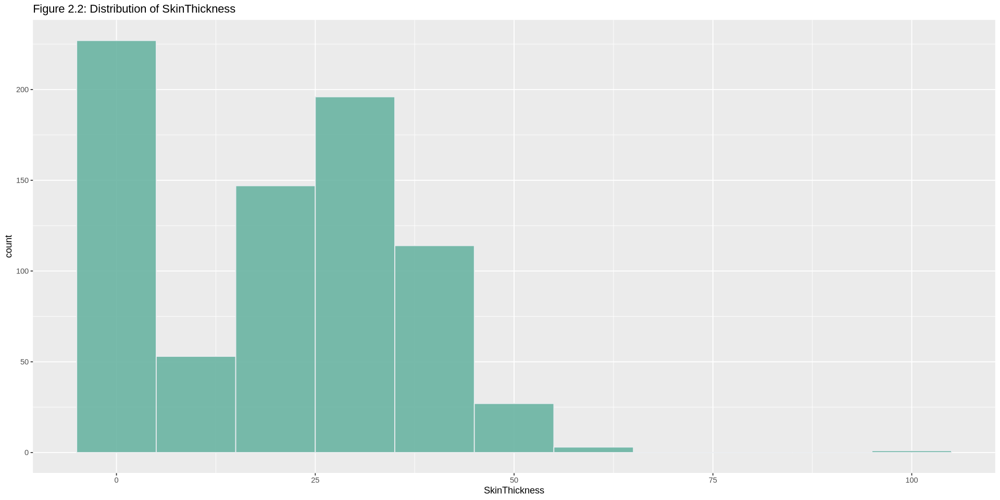

In [6]:
#Main Developer: Maxwell
Histogram_Insulin <- diabete %>% 
                     ggplot(aes(x = Insulin)) + 
                     geom_histogram(binwidth = 10, fill = "#69b3a2", color = "#e9ecef", alpha = 0.9) +
                     ggtitle("Figure 2.1: Distribution of Insulin")
Histogram_Insulin

Histogram_SkinThickness <- diabete %>% 
                           ggplot(aes(x = SkinThickness)) + 
                           geom_histogram(binwidth = 10, fill = "#69b3a2", color = "#e9ecef", alpha = 0.9) +
                           ggtitle("Figure 2.2: Distribution of SkinThickness")
Histogram_SkinThickness

#### III. Accounting for Missing Values:

##### Missing Values Percents 

In [7]:
#Main Developer: Maxwell
#Main Developer: Gloria
count <- diabete %>%
    select(Glucose, BloodPressure, SkinThickness, Insulin, BMI) %>% # Select the relevant columns
    summarize_all(~ sum(. == 0)) / nrow(diabete) # Count zeros in each column
count

Glucose,BloodPressure,SkinThickness,Insulin,BMI
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.006510417,0.04557292,0.2955729,0.4869792,0.01432292


We can see that almost half of the Insulin values are missing along with almost 30 percent of the SkinThickness values. Due to the potential issues these missing values could cause by creating inaccurate predictions and leading to potential bias, we remove these columns from our dataset before performing our analysis.

In [8]:
diabete <- diabete |> 
    select(-Insulin, -SkinThickness) |>
    filter(Glucose != 0, BloodPressure != 0, BMI != 0)
head(diabete)

,Pregnancies,Glucose,BloodPressure,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,33.6,0.627,50,1
2,1,85,66,26.6,0.351,31,0
3,8,183,64,23.3,0.672,32,1
4,1,89,66,28.1,0.167,21,0
5,0,137,40,43.1,2.288,33,1
6,5,116,74,25.6,0.201,30,0


In [9]:
nrow(diabete)

[1] 724

Our filtered dataset retains most of the observations with a total count of 724 observations. Our dataset is ready to be modelled. 

## 3. Methods: 

The report will be building a prediction model using logistic regression on the diabetes dataset which will be spliced for training and testing. A full model would be deployed and compared against a LASSO regularized model with cross validation. Metrics such as AIC, BIC, Sensitivity etc. will be leveraged to understand key differences between the models and ultimately choose the one with stronger predictive power. Confusion matrices and AUC ROC curves will be drwan for each model to assist with the former decision. 

Since the predictor, Outcome, is a binary response predicting if a patient has diabetes or not, the choice of logistic regression for classification seems appropriate. However, it is important to note a few key assumptions our model will be making before heading into the model construction.

##### Following are few of the assumptions for our logistic model:
1. Observations in our diabetes dataset are independent of each other.
2. The relationship between the predictors and the log-odds of the outcome is linear.
3. Predictors must not have perfect correlation (which was proven already above in Figure 1)
4. The dataset has enough samples per predictor to ensure stable and reliable coefficient estimates.

In [19]:
#setting seed for reproducibility
set.seed(123)

#spitting the data into testing and training datasets
train_indices <- sample(seq_len(nrow(diabete)), size = 0.7 * nrow(diabete))
train_data <- diabete[train_indices, ]
test_data <- diabete[-train_indices, ]

#### I. Full Model:

In [20]:
# Fit a full logistic regression model on the training data
full_model <- glm(Outcome ~ ., data = train_data, family = binomial)
summary(full_model)


Call:
glm(formula = Outcome ~ ., family = binomial, data = train_data)

Coefficients:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)              -9.038712   0.975382  -9.267  < 2e-16 ***
Pregnancies               0.134780   0.039961   3.373 0.000744 ***
Glucose                   0.035395   0.004418   8.011 1.14e-15 ***
BloodPressure            -0.007601   0.010265  -0.741 0.458987    
BMI                       0.097933   0.019281   5.079 3.79e-07 ***
DiabetesPedigreeFunction  0.891217   0.371990   2.396 0.016584 *  
Age                       0.007420   0.011720   0.633 0.526649    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 652.58  on 505  degrees of freedom
Residual deviance: 466.85  on 499  degrees of freedom
AIC: 480.85

Number of Fisher Scoring iterations: 5


In [24]:
tidy(
    full_model,
    exponentiate = TRUE,
    conf.int = TRUE,
)
cat("Table 1: Full Logistic Model Results for Predicting Diabetes\n")

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.0001187237,0.975382008,-9.2668428,1.917373e-20,1.618086e-05,0.0007465259
Pregnancies,1.1442848371,0.039961333,3.3727565,7.441974e-04,1.059197e+00,1.2392447786
Glucose,1.0360285413,0.004418169,8.0111682,1.136239e-15,1.027371e+00,1.0453619819
BloodPressure,0.9924277680,0.010264526,-0.7405161,4.589869e-01,9.726130e-01,1.0126769362
BMI,1.1028893349,0.019280632,5.0793670,3.786945e-07,1.062843e+00,1.1465533018
DiabetesPedigreeFunction,2.4380956129,0.371990448,2.3958068,1.658383e-02,1.186412e+00,5.1104163787
Age,1.0074478338,0.011719929,0.6331297,5.266489e-01,9.842850e-01,1.0307308077


Table 1: Full Logistic Model Results for Predicting Diabetes


The estimated coefficients for our full logistic model in Table 1 suggest that all predictors except `BloodPressure` and `Age` are statistically significant at 5% with p-values less than 0.05. For each additional `Pregnancies`, the odds of the outcome (having diabetes) increase by approximately 14.42% (holding all other variables constant). Similarly, a unit increase in `Glucose` results in odds of the having diabetes increasing by 3.6%, 10.29% for unit increase in 
`BMI`, and 143.81% for unit increase in`DiabetesPedigreeFunction`, given that all other predictors are kept constant. 

To gauge a better understanding of model performance, we perform predictions on the testing dataset in the codeblock below:

In [25]:
# Predict on the test data
predicted_probs_full <- predict(full_model, newdata = test_data, type = "response")
predicted_classes_full <- ifelse(predicted_probs_full > 0.5, 1, 0)

# Confusion matrix and accuracy
confusion_matrix_full <- table(Actual = test_data$Outcome, Predicted = predicted_classes_full)
accuracy_full <- sum(diag(confusion_matrix_full)) / sum(confusion_matrix_full)
print(confusion_matrix_full)
print(paste("Full Model Accuracy:", round(accuracy_full, 4)))

      Predicted
Actual   0   1
     0 129  15
     1  36  38
[1] "Full Model Accuracy: 0.7661"


Our full model achieves an accuracy of 0.7661 while predicting on the test set. The confusion matrix above shows the number of correct predictions and misclassifications. 

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Full Model AUC: 0.8335"


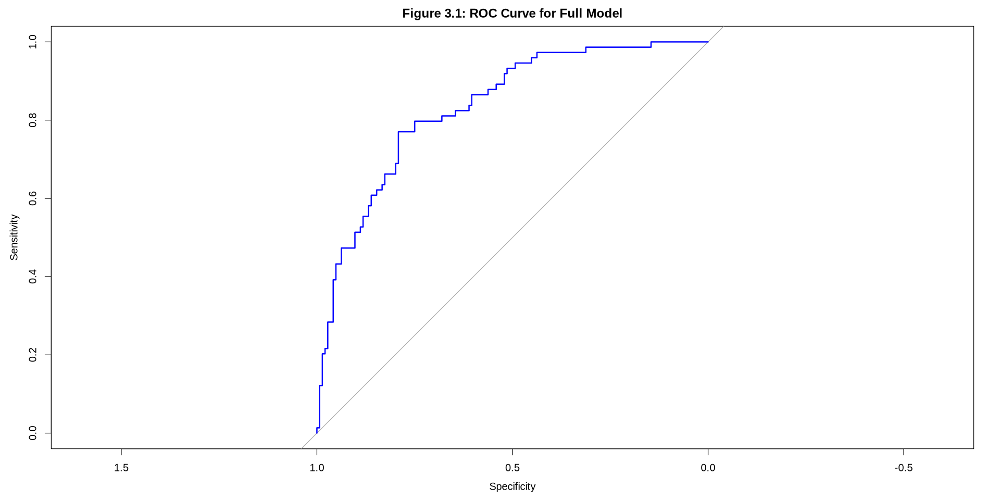

In [28]:
# ROC and AUC for full model
roc_curve_full <- roc(test_data$Outcome, predicted_probs_full)
auc_full <- auc(roc_curve_full)
print(paste("Full Model AUC:", round(auc_full, 4)))

# Plot ROC curve
plot(roc_curve_full, main = "Figure 3.1: ROC Curve for Full Model", col = "blue", lwd = 2)

Our full model achieves an AUC of 0.8335. This suggests that the model exhibits a good discriminatory ability which is reflected in the ROC curve in Figure 3.1. 

#### II. LASSO Model:

In the section below, we perform LASSO using cross-validation on the model to see if regularization enhances the model's classification ability. 

In [30]:
set.seed(123)

# Fit Lasso Model
x_train <- as.matrix(train_data[, -which(names(train_data) == "Outcome")])
y_train <- train_data$Outcome
x_test <- as.matrix(test_data[, -which(names(test_data) == "Outcome")])
y_test <- test_data$Outcome

cv_lasso <- cv.glmnet(x_train, y_train, family = "binomial", alpha = 1, nfolds = 5)
optimal_lambda <- cv_lasso$lambda.min
print(optimal_lambda)

[1] 0.01432253


Our optimal regularization parameter, $\lambda$, is found to be 0.0143.

In [32]:
coef(cv_lasso, s = "lambda.min")

7 x 1 sparse Matrix of class "dgCMatrix"
                                   s1
(Intercept)              -8.059819184
Pregnancies               0.106735194
Glucose                   0.031691161
BloodPressure             .          
BMI                       0.078642607
DiabetesPedigreeFunction  0.614673143
Age                       0.002686946

Using the optimal $\lambda$, we find that LASSO shrinks the coefficient for `BloodPressure` to 0. `DiabetesPedigreeFunction` appears to be the strongest predictor according to our LASSO model above, whereas `Age` seems to be the weakest. 

In [33]:
lasso_final <- glmnet(x_train, y_train, family = "binomial", alpha = 1, lambda = optimal_lambda)

# Predict on test data using Lasso model
predicted_probs_lasso <- predict(cv_lasso, s = optimal_lambda, newx = x_test, type = "response")
predicted_classes_lasso <- ifelse(predicted_probs_lasso > 0.5, 1, 0)

# Confusion matrix and accuracy for Lasso model
confusion_matrix_lasso <- table(Actual = y_test, Predicted = predicted_classes_lasso)
accuracy_lasso <- sum(diag(confusion_matrix_lasso)) / sum(confusion_matrix_lasso)
print(confusion_matrix_lasso)
print(paste("Lasso Model Accuracy:", round(accuracy_lasso, 4)))

      Predicted
Actual   0   1
     0 130  14
     1  38  36
[1] "Lasso Model Accuracy: 0.7615"


The LASSO model achieves an accuracy of 0.7615 while predicting on the test set. The confusion matrix above shows the number of correct predictions and misclassifications. 

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "Lasso Model AUC: 0.8314"


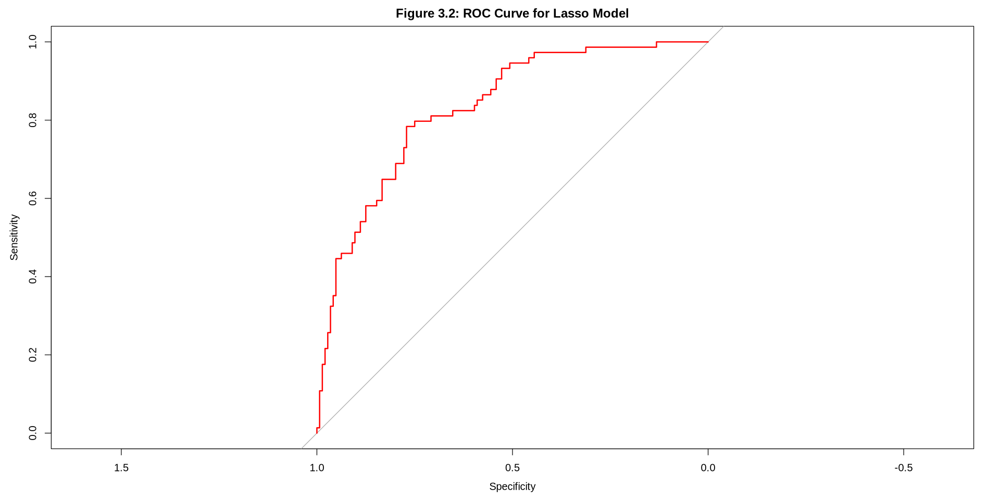

In [37]:
# ROC and AUC for Lasso model
roc_curve_lasso <- roc(y_test, as.vector(predicted_probs_lasso))
auc_lasso <- auc(roc_curve_lasso)
print(paste("Lasso Model AUC:", round(auc_lasso, 4)))

# Plot ROC curve for Lasso
plot(roc_curve_lasso, main = "Figure 3.2: ROC Curve for Lasso Model", col = "red", lwd = 2)

#### III. Comparision between the Full vs. LASSO models:

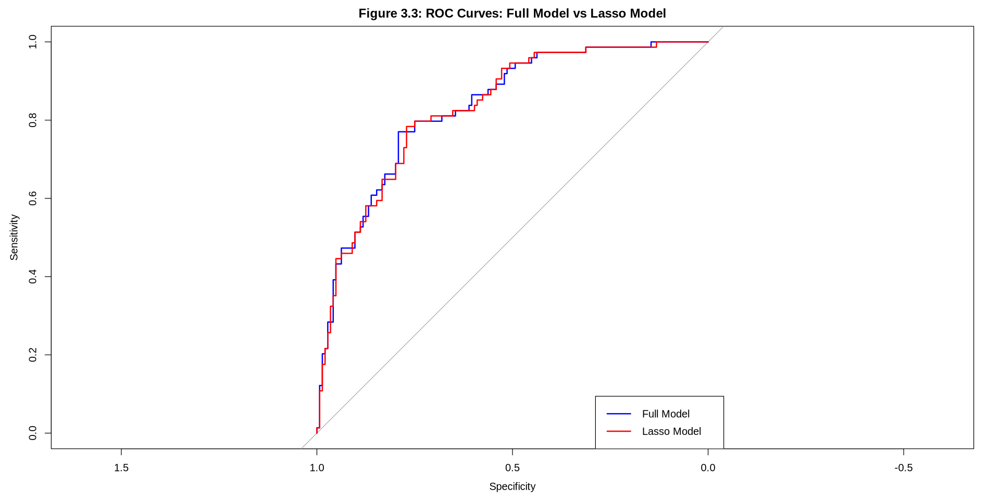

In [39]:
# Plot ROC curves for both models
plot(roc_curve_full, col = "blue", lwd = 2, main = "Figure 3.3: ROC Curves: Full Model vs Lasso Model")
lines(roc_curve_lasso, col = "red", lwd = 2)
legend("bottomright", legend = c("Full Model", "Lasso Model"),
       col = c("blue", "red"), lwd = 2)

Figure 3.3 overlays the ROC curves for LASSO and the full model on top of each other. We observe that they both look highly similar with minimal differences. Hence, we must leverage other metrics to compare the two and ultimately move forward with the better performing model. 

In [44]:
# Fit the full logistic regression model
full_model <- glm(Outcome ~ ., data = train_data, family = binomial)

# AIC and BIC for full model
aic_full <- AIC(full_model)
bic_full <- BIC(full_model)

## Lasso
predicted_probs_train <- predict(lasso_final, newx = x_train, type = "response")
log_likelihood_lasso <- sum(y_train * log(predicted_probs_train) + (1 - y_train) * log(1 - predicted_probs_train))

# Number of non-zero coefficients (excluding the intercept)
k_lasso <- sum(coef(lasso_final) != 0) - 1  # Remove intercept

# Number of observations
n <- nrow(train_data)

# Calculate AIC and BIC for Lasso model
aic_lasso <- -2 * log_likelihood_lasso + 2 * k_lasso
bic_lasso <- -2 * log_likelihood_lasso + log(n) * k_lasso

# Confusion matrix for full model
confusion_matrix_full <- table(Actual = test_data$Outcome, Predicted = predicted_classes_full)

# Sensitivity and specificity for full model
tp_full <- confusion_matrix_full[2, 2]  # True Positives
fn_full <- confusion_matrix_full[2, 1]  # False Negatives
tn_full <- confusion_matrix_full[1, 1]  # True Negatives
fp_full <- confusion_matrix_full[1, 2]  # False Positives

sensitivity_full <- tp_full / (tp_full + fn_full)
specificity_full <- tn_full / (tn_full + fp_full)

# Confusion matrix for Lasso model
confusion_matrix_lasso <- table(Actual = y_test, Predicted = predicted_classes_lasso)

# Sensitivity and specificity for Lasso model
tp_lasso <- confusion_matrix_lasso[2, 2]  # True Positives
fn_lasso <- confusion_matrix_lasso[2, 1]  # False Negatives
tn_lasso <- confusion_matrix_lasso[1, 1]  # True Negatives
fp_lasso <- confusion_matrix_lasso[1, 2]  # False Positives

sensitivity_lasso <- tp_lasso / (tp_lasso + fn_lasso)
specificity_lasso <- tn_lasso / (tn_lasso + fp_lasso)

model_metrics <- data.frame(
  Model = c("Full Model", "Lasso Model"),
  AIC = c(aic_full, aic_lasso),
  BIC = c(bic_full, bic_lasso),
  AUC = c(auc_full, auc_lasso),
  Accuracy = c(accuracy_full, accuracy_lasso),
  Sensitivity = c(sensitivity_full, sensitivity_lasso),
  Specificity = c(specificity_full, specificity_lasso)
)
model_metrics

cat("Table 2: Metrics for Each Model\n\n")

Model,AIC,BIC,AUC,Accuracy,Sensitivity,Specificity
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Full Model,480.8470,510.4327,0.8335210,0.7660550,0.5135135,0.8958333
Lasso Model,480.3066,501.4393,0.8313626,0.7614679,0.4864865,0.9027778


Table 2: Metrics for Each Model



## 4. Discussion: 

Results from Table 2 suggest that the Full Model has higher accuracy and sensitivity when compared with the LASSO model. However, the LASSO Model has lower AIC/BIC scores and a higher specificity than the Full Model. The differences between the metrics are very minute, suggesting that both approaches lead to similar results. However, as the main aim of the model is to correctly identify diabetic patients, we prefer sensitivity. Hence, the report prefers the Full Model. Such results were expected due to the regularization constraint present in LASSO, which trades off sensitivity for specificity. 

While comparing model estimates, we observe that `BloodPressure` was not statistically significant in our Full Model and was also shrunk to zero in the LASSO model. `Age`was another predictor with weak impact found in the LASSO model and non-significance in the Full Model. However, since the aim of this report is not to draw inference about the most efficient model, the aforementioned predictors remain included. Exclusion of `Insulin` and `SkinThickness` was justified due to the counts of the missing values.

The Full Model achieves an accuracy of 76.6% which can potentially be improved if non-linear patterns were explored. Comparing these regression approaches against Ensemble methods such as Random Forests and Gradient Boosting might be worthwhile for further study. Since our sample size was made up of 724 observations, the full model has a small subset of data to train over (as it was spliced proportionally by 70%). Having a larger sample size could boost model's statistical power and prediction performance. Additionally, our dataset had a class imbalance (approximately 70 to 30) for our response, which could have skewed our calculations. To overcome said issue, weighted loss functions can be evaluated. Since this dataset was specifically gathered from female patients of an Indian Pima descent, the model could be biased to them, and might not perform as well on the male population and people from other ethnicities. 

The findings in this report would be crucial in the healthcare industry in assisting them to develop a model which could predict Diabetes on new patients automatically. Automation of Diabetes identification could lead to faster recovery if the disease is detected early and could be substantial for the future of modern medicine. Further investigation and studies could study the generalization of such a prediction model over multiple diversities and ethnicities, the generalization of this model on a longer period of time, and extensions of this predictive modelling techniques to other fatal, malignant diseases/infections. 

## 5. References: 

1. Ali O. (2013). Genetics of type 2 diabetes. World journal of diabetes, 4(4), 114–123. https://doi.org/10.4239/wjd.v4.i4.114
2. American Diabetes Association (2010). Diagnosis and classification of diabetes mellitus. Diabetes care, 33 Suppl 1(Suppl 1), S62–S69. https://doi.org/10.2337/dc10-S062
3. Egan, A. M., & Dinneen, S. F. (2022). What is diabetes? Medicine, 50(10), 615–618. https://doi.org/10.1016/j.mpmed.2022.07.001
4. Predict Diabetes from Kaggle: https://www.kaggle.com/datasets/whenamancodes/predict-diabities/data